In [1]:
import cpp_soft_info

# Load Data

In [2]:
%reload_ext autoreload
%autoreload 2

In [3]:
from result_saver import SaverProvider
provider = SaverProvider()

In [12]:
import numpy as np
from Scratch import metadata_loader

DEVICE = 'ibm_torino'

md = metadata_loader(_extract=True, _drop_inutile=True)
# md = md[md["job_status"] == "JobStatus.DONE"]
# md = md[md["notebook_name"] == "bigger_rep_codes"]
max_distance = int(max(md.distance))
max_distance = 10
md = md[md["distance"] == max_distance]
md = md[md["backend_name"]==DEVICE]


md = md[md["shots"]==10000]
md = md[:2]

md

,creation_date,notebook_name,backend_name,job_id,tags,meas_level,shots,tags_xp,rep_delay,sampled_state,...,job_status,execution_date,extra,optimization_level,code,distance,rounds,logical,layout,descr
2528,2023-12-02 11:16:20.667000+01:00,torino_repcode,ibm_torino,cnng7x70k0p00088v8vg,[RepCode],1.0,10000.0,NaN,NaN,NaN,...,JobStatus.DONE,2023-12-02 11:18:18.144738+01:00,NaN,NaN,RepetitionCodeCircuit,10.0,10,1,"_is_hex=True, sherbrooke",diff rounds v2
2527,2023-12-02 11:16:18.322000+01:00,torino_repcode,ibm_torino,cnng7wq24wx0008fagdg,[RepCode],1.0,10000.0,NaN,NaN,NaN,...,JobStatus.DONE,2023-12-02 11:16:48.914779+01:00,NaN,NaN,RepetitionCodeCircuit,10.0,10,0,"_is_hex=True, sherbrooke",diff rounds v2


In [13]:
memories = {}
jobs = {}
for job_id, logical in zip(md.job_id, md.logical):
    mmr_name = f"mmr_log_{logical}"
    memories[mmr_name] = provider.retrieve_job(job_id).result().get_memory()
    jobs[mmr_name] = job_id

memory_str = "mmr_log_1"
memory = memories[memory_str][:100]
job_id = jobs[memory_str]
print(memory.shape)

(100, 100)


# Initialize the code

In [14]:
import stim
import pymatching

from soft_info import get_repcode_layout, get_repcode_IQ_map
from Scratch import create_or_load_kde_grid

d = max_distance
synd_rounds = max_distance
synd_rounds = 10

circuit = stim.Circuit.generated("repetition_code:memory",
                                 distance=d,
                                 rounds=synd_rounds,
                                 after_clifford_depolarization=0.1)

model = circuit.detector_error_model(decompose_errors=True)

# layout = get_repcode_layout(distance=max_distance, backend=provider.get_backend(DEVICE), _is_hex=True)

##### TORINO ####
distance = max_distance
import pickle
with open('longest_path_torino.pkl', 'rb') as f:
    path = pickle.load(f)
bounded_path = path[:2 * distance - 1]
layout = bounded_path[1::2] + bounded_path[::2] 


qubit_mapping = get_repcode_IQ_map(layout, synd_rounds) #Hardcoded for repetition codes
# print(qubit_mapping)
# print(len(qubit_mapping))

In [15]:
other_date = None # if none then it will find the closest to the tobecalib_job date
# other_date = "2023-11-22T10:30:00" # "2023-11-22T" works too
grid_dict, processed_scaler_dict = create_or_load_kde_grid(provider, job_id, num_grid_points=5, 
                                                           num_std_dev=0.3, other_date=other_date)

# takes 10s

Specified job execution date: 2023-12-02 11:18:18.144738+01:00
Found jobs for backend ibm_torino with closest execution date 2023-12-02 09:12:35.042892+00:00.
Searching for ibm_torino and 23.12.02_09h11_5pts_0.3std


In [16]:
# get_counts
counts = cpp_soft_info.get_counts(memory, qubit_mapping, grid_dict, processed_scaler_dict, synd_rounds)

# Decode

In [21]:
matching = pymatching.Matching.from_detector_error_model(model)
# p_data = 6.869e-3 # mean sherbrooke noise
p_data = 1.15e-2
result = cpp_soft_info.decode_IQ_shots(matching._matching_graph, memory,
                                           synd_rounds, 1, True, qubit_mapping, grid_dict,
                                           processed_scaler_dict, p_data=p_data, p_mixed=p_data/1, #p_mixed=1e-80, for d=30
                                           common_measure=-1, _bimodal=False, merge_strategy = "replace", _detailed=True)
print("num_errors:", result.num_errors, "out of", len(memory), "shots")
 
# takes 5s

num_errors: 40 out of 100 shots


# Draw result

40
280
4.453841686248779
4.453841686248779 0.05333333333333338 set()
[(1, 10), (2, 3), (14, 5), (15, 24), (23, 32), (7, 16), (8, -1), (9, 19), (18, 27), (21, 30), (22, 31), (36, 45), (39, 48), (57, 56), (84, 83), (73, 64), (46, 37), (46, 55), (70, 71), (52, 51), (59, 60), (41, 50), (49, 58), (54, 63), (67, 76), (68, 77), (72, 81), (82, 91), (85, 86)]
[0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0]


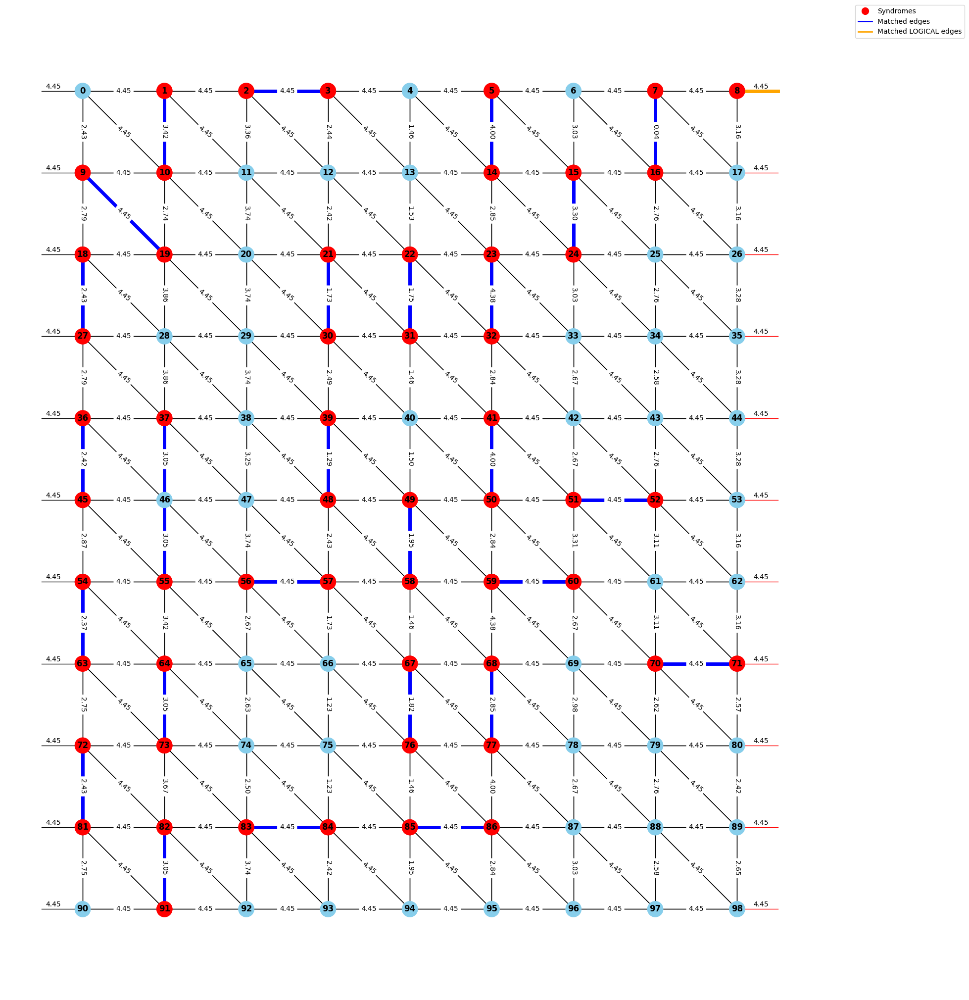

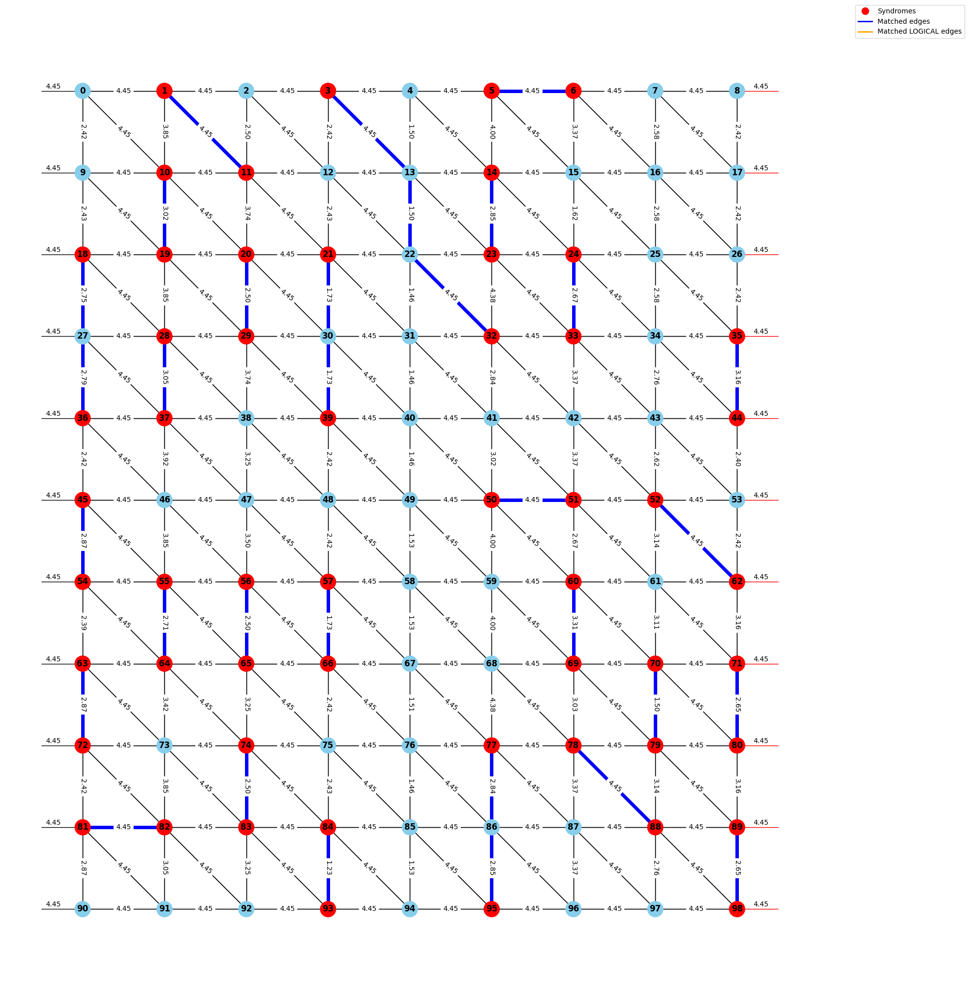

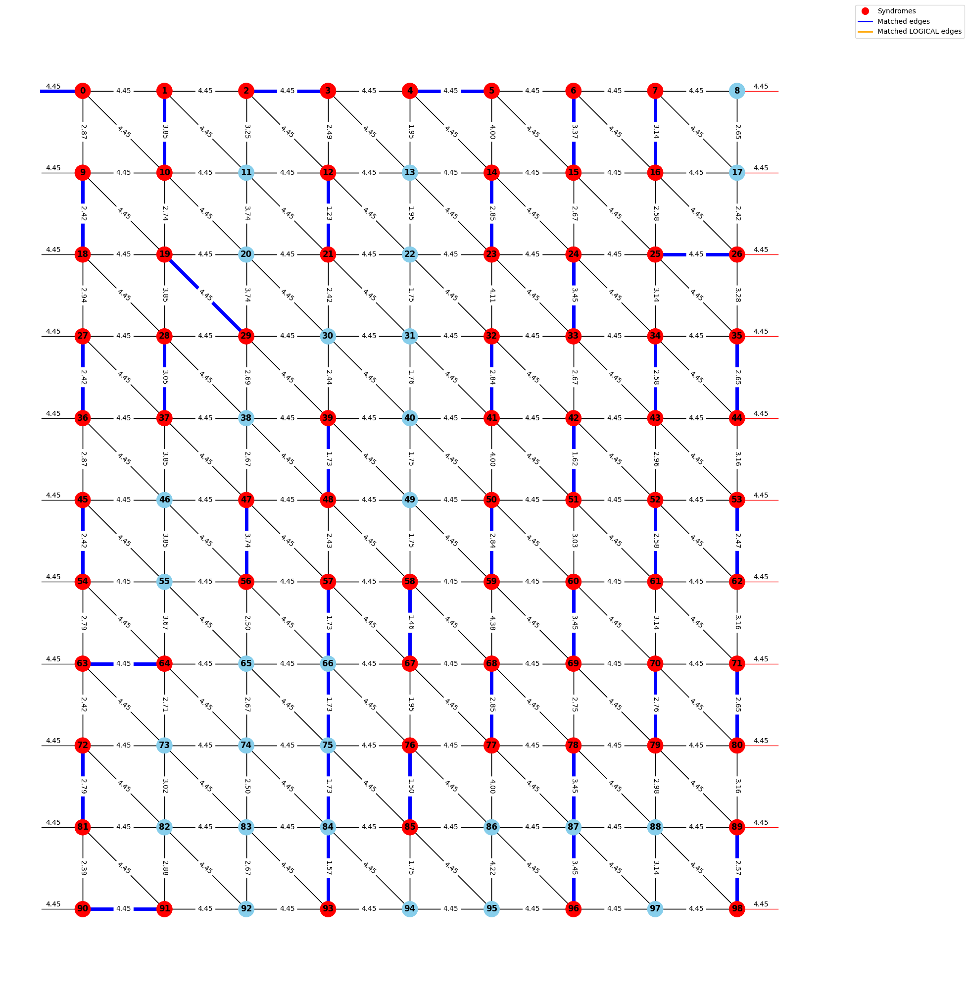

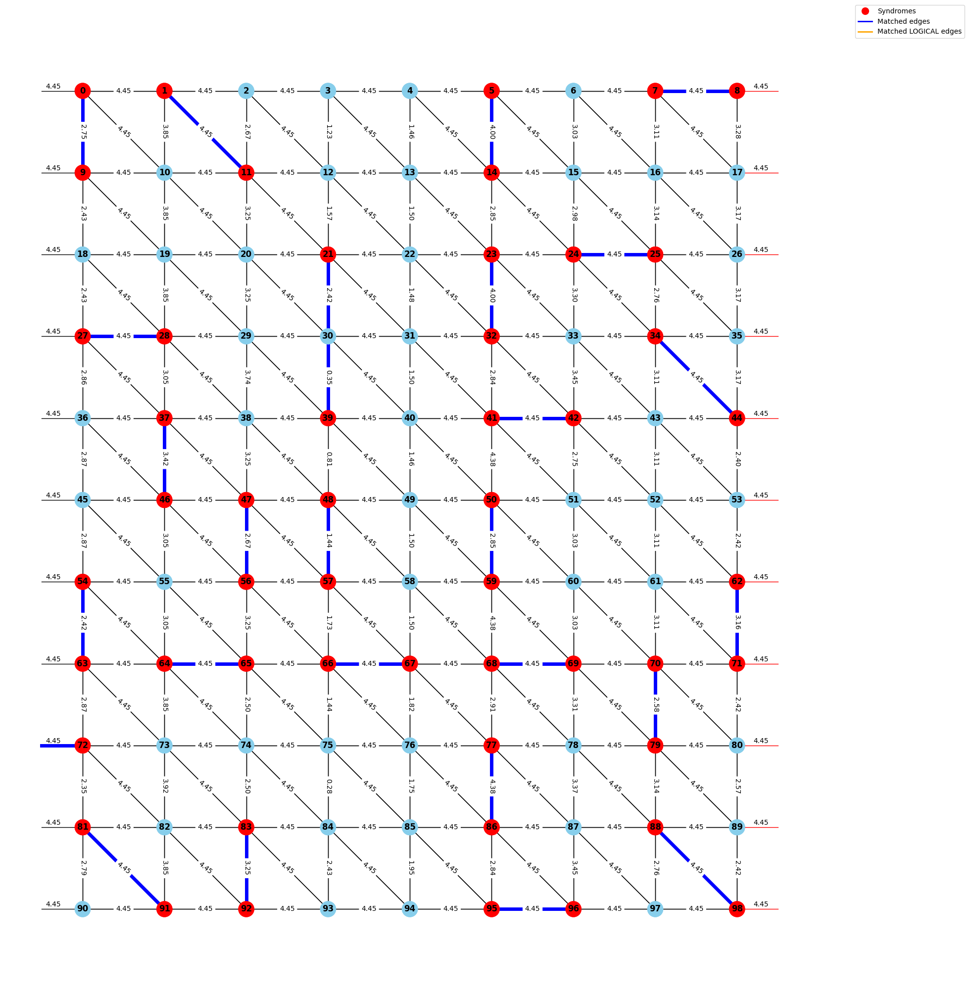

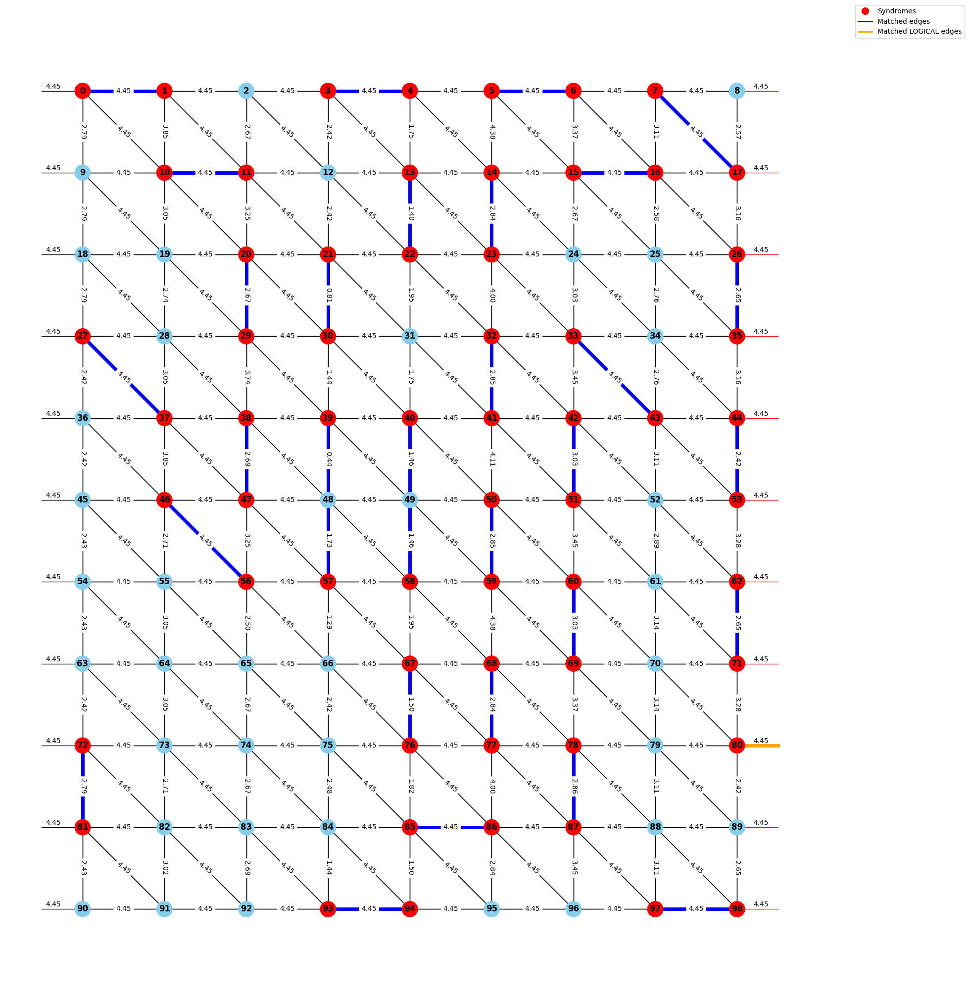

...

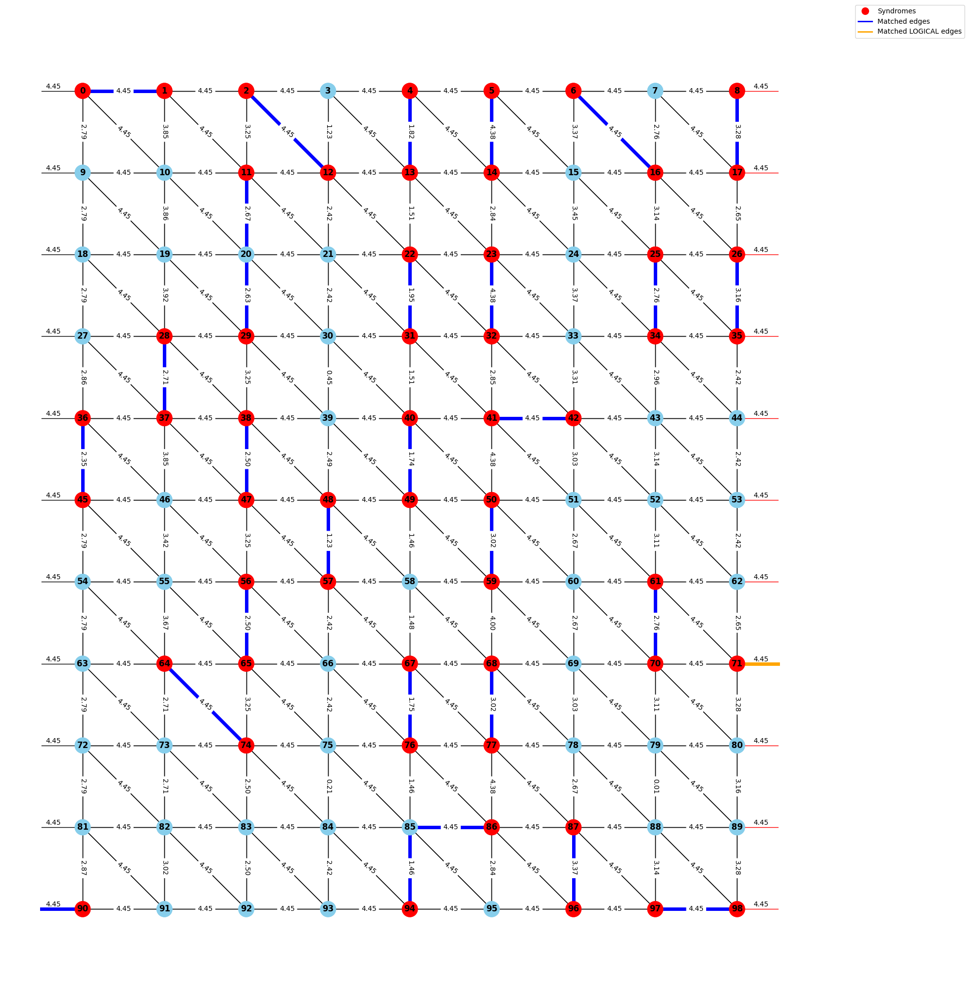

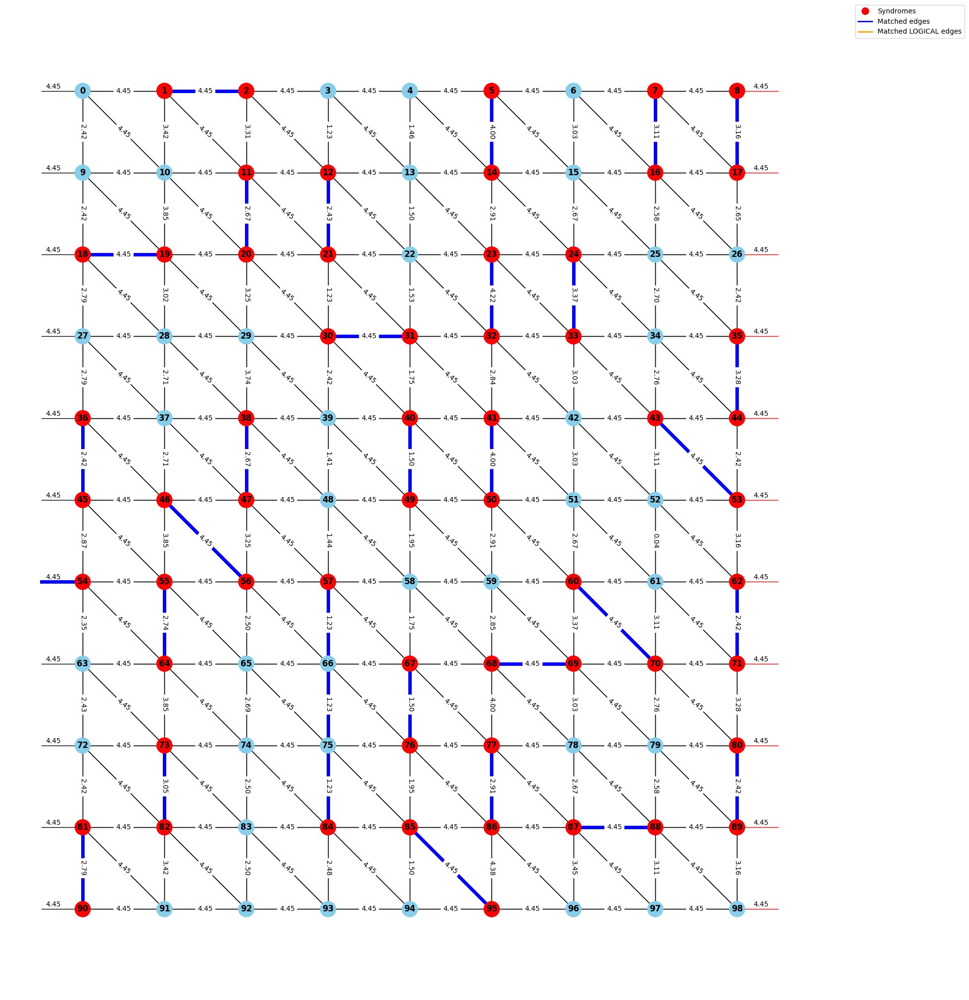

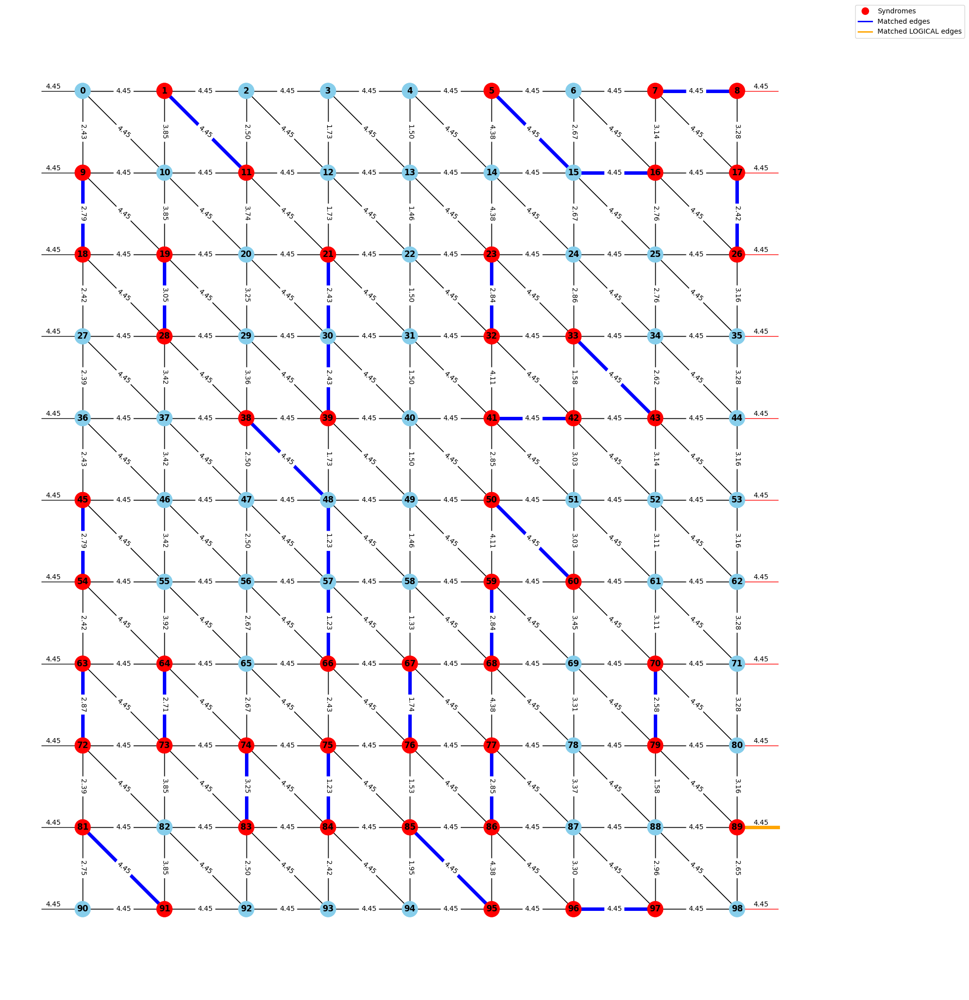

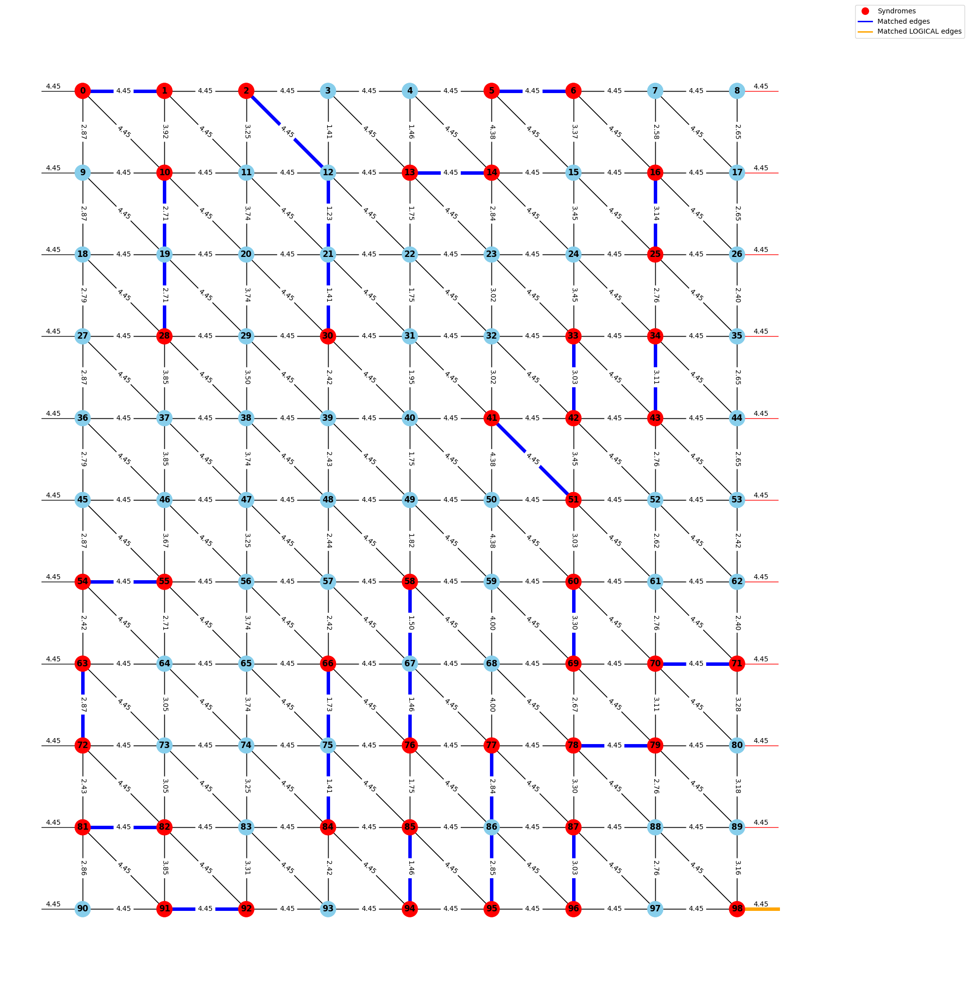

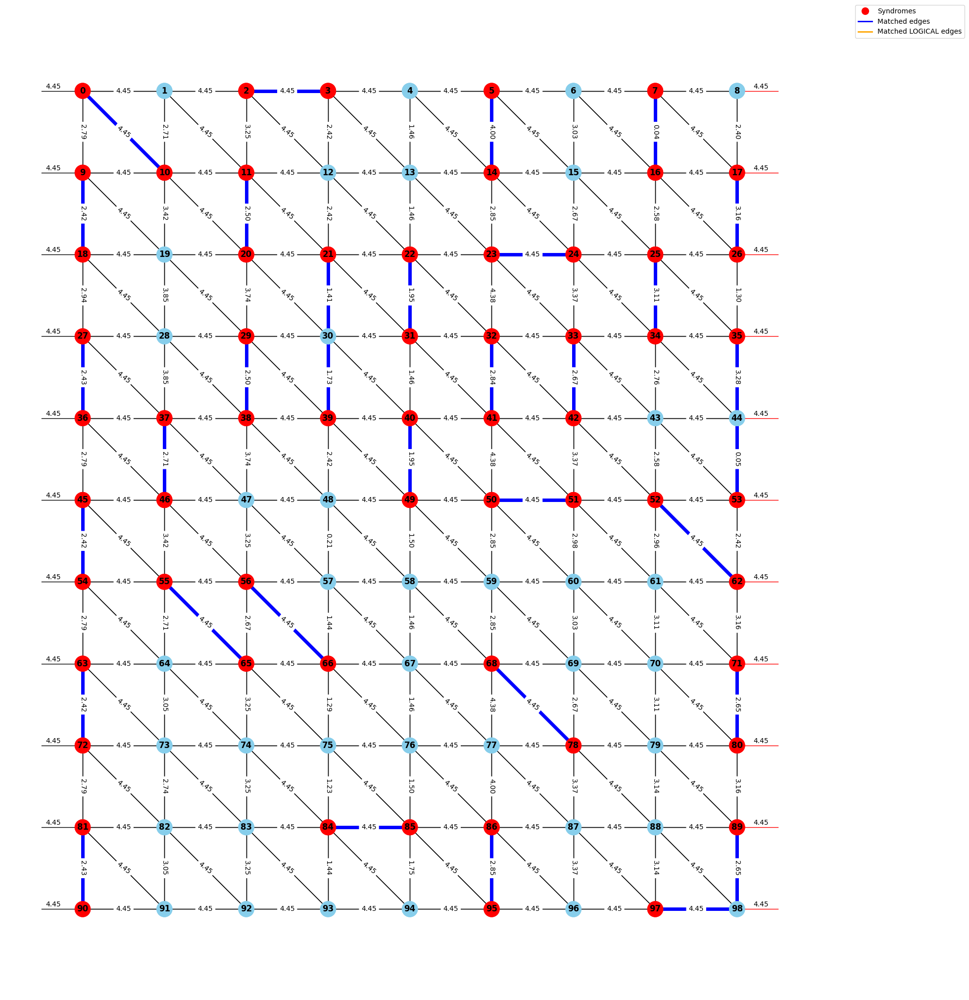

In [27]:
print(len(result.error_details)) # is the number of errors
print(len(result.error_details[0].edges)) # is the number of EDGES in the first error
print((result.error_details[0].edges[0].attributes.weight)) # get the WEIGHT
node1, node2, edge_data = result.error_details[0].edges[0].node1, result.error_details[0].edges[0].node2, result.error_details[0].edges[0].attributes
print(edge_data.weight, edge_data.error_probability, edge_data.fault_ids)
print((result.error_details[0].matched_edges)) # get the MATCHED EDGES
print((result.error_details[0].detection_syndromes)) # get the DETECTION SYNDROMES

from soft_info import draw_matching_graph

for i in range(len(result.error_details)):
    draw_matching_graph(matching=None, d=d, T=synd_rounds, syndromes=result.error_details[i].detection_syndromes,
                        matched_edges=result.error_details[i].matched_edges, figsize=(20,20), edge_list=result.error_details[i].edges)